In [7]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats, linalg
import os
import sys

In [8]:
predictors = ['mean','median','prctile33','min','prctile5','max','prctile95', 'std', 'MAD',
'skewness','IQR','MTD','meanci_1','meanci_2','Diff_median_of_plot','Diff_mean_of_plot','Diff_std_of_plot', 
'Diff_median_of_row','Diff_mean_of_row','Diff_std_of_row', 'mean_first_ring', 'mean_second_ring',
'mean_third_ring','mean_core', 'median_first_ring','median_second_ring', 'median_third_ring',
'median_core', 'CWSI', 'CWSI_minus_CWSI_of_row','kurtosis']
df_out = pd.read_excel(os.path.join(os.getcwd(), 'data_Kedma&Lavi_without_outlires.xlsx')).iloc[: , 1:]
df_out.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 393 entries, 0 to 392
Data columns (total 36 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   RTK_Num_All_Plots_Data  393 non-null    int64  
 1   Plot_All_Plots_Data     393 non-null    object 
 2   Site_Name               393 non-null    object 
 3   mean                    393 non-null    float64
 4   min                     393 non-null    float64
 5   prctile5                393 non-null    float64
 6   max                     393 non-null    float64
 7   prctile95               393 non-null    float64
 8   std                     393 non-null    float64
 9   MTD                     393 non-null    float64
 10  median                  393 non-null    float64
 11  skewness                393 non-null    float64
 12  kurtosis                393 non-null    float64
 13  IQR                     393 non-null    float64
 14  MAD                     393 non-null    fl

# Correlation

## Pearson Full Correlation

In [9]:
def correlations(data,threshold,dataset_name):
    sns.set(font_scale=2)
    plt.figure(figsize=(30,20))
    correlations = data.corr()
    sns.heatmap(round(correlations,2), cmap='RdBu', annot=True, 
                annot_kws={"size": 15}, vmin=-1, vmax=1).set_title(dataset_name+' - Unordered correlation matrix',fontsize=50)

    from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
    from scipy.spatial.distance import squareform
    sns.set_style("whitegrid")

    # plt.figure(figsize=(12,5))
    dissimilarity = 1 - abs(correlations)
    Z = linkage(squareform(dissimilarity), 'complete')
    f, ax =plt.subplots(1, 1,figsize=(15,6))
    ax.title.set_text(dataset_name+' - Dendrogram of the Hierarchical Clustering')
    dendrogram(Z, labels=data.columns,ax=ax, orientation='top',
               leaf_rotation=90)
    ax.tick_params(axis='x', which='major', labelsize=15)
    ax.tick_params(axis='y', which='major', labelsize=15)
    # Clusterize the data
    labels = fcluster(Z, threshold, criterion='distance')

    # Show the cluster
    import numpy as np

    # Keep the indices to sort labels
    labels_order = np.argsort(labels)

    # Build a new dataframe with the sorted columns
    for idx, i in enumerate(data.columns[labels_order]):
        if idx == 0:
            clustered = pd.DataFrame(data[i])
        else:
            df_to_append = pd.DataFrame(data[i])
            clustered = pd.concat([clustered, df_to_append], axis=1)
    plt.figure(figsize=(30,20))
    correlations = clustered.corr()
    sns.heatmap(round(correlations,2), cmap='RdBu', annot=True, 
                annot_kws={"size": 15}, vmin=-1, vmax=1).set_title(dataset_name+' - Ordered correlation matrix according to threshold',fontsize=50)
    sns.set(font_scale=2)
    g = sns.clustermap(correlations, method="complete", cmap='RdBu', annot=True, 
                   annot_kws={"size": 15}, vmin=-1, vmax=1, figsize=(30,25)).fig.suptitle(dataset_name+' - Ordered correlation matrix with the Dendrogram',fontsize=50)

### Keamd & Lavi

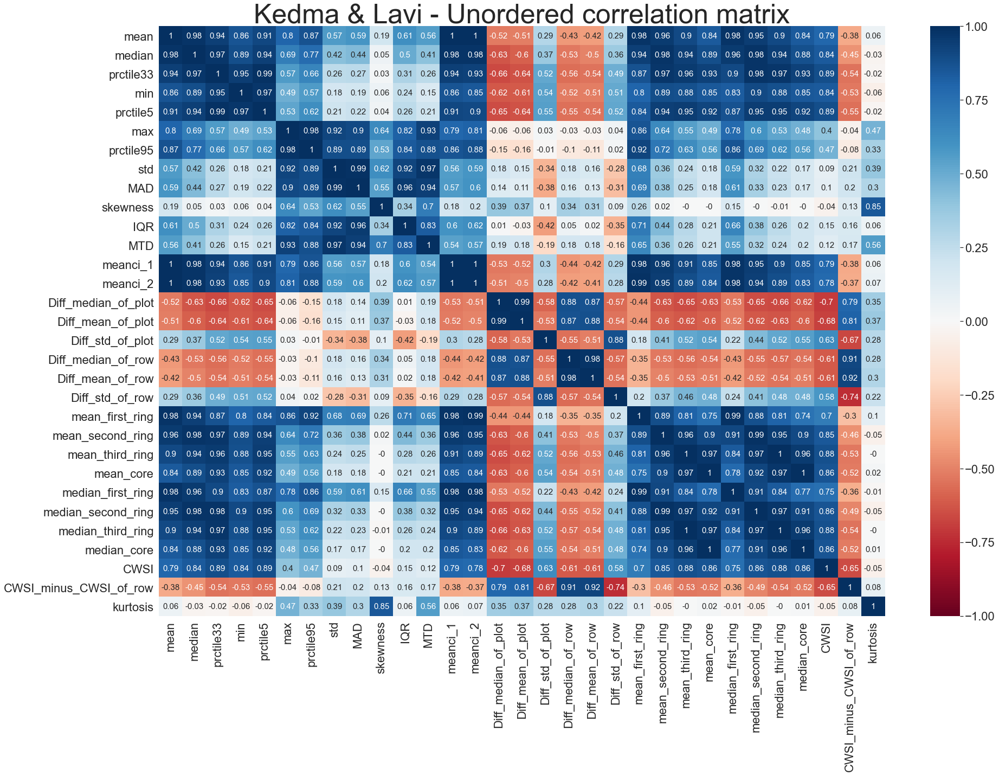

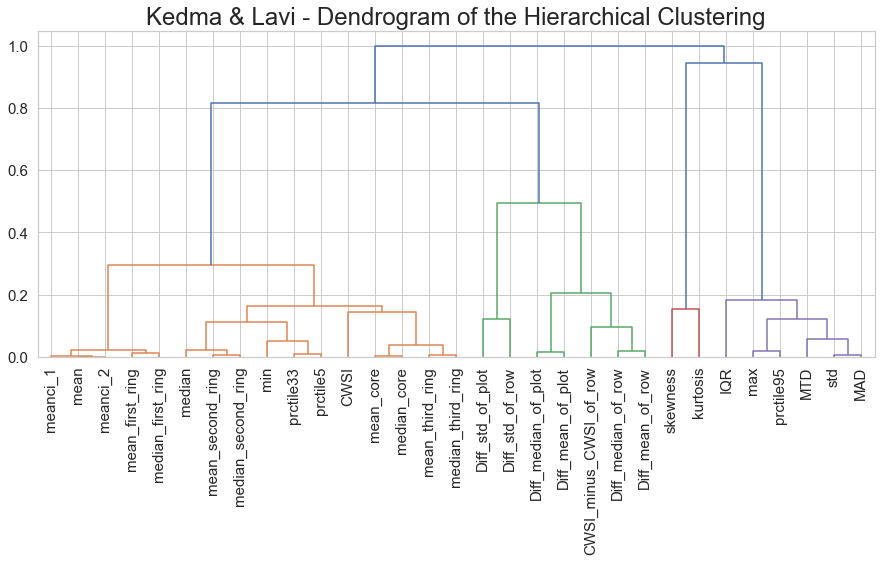

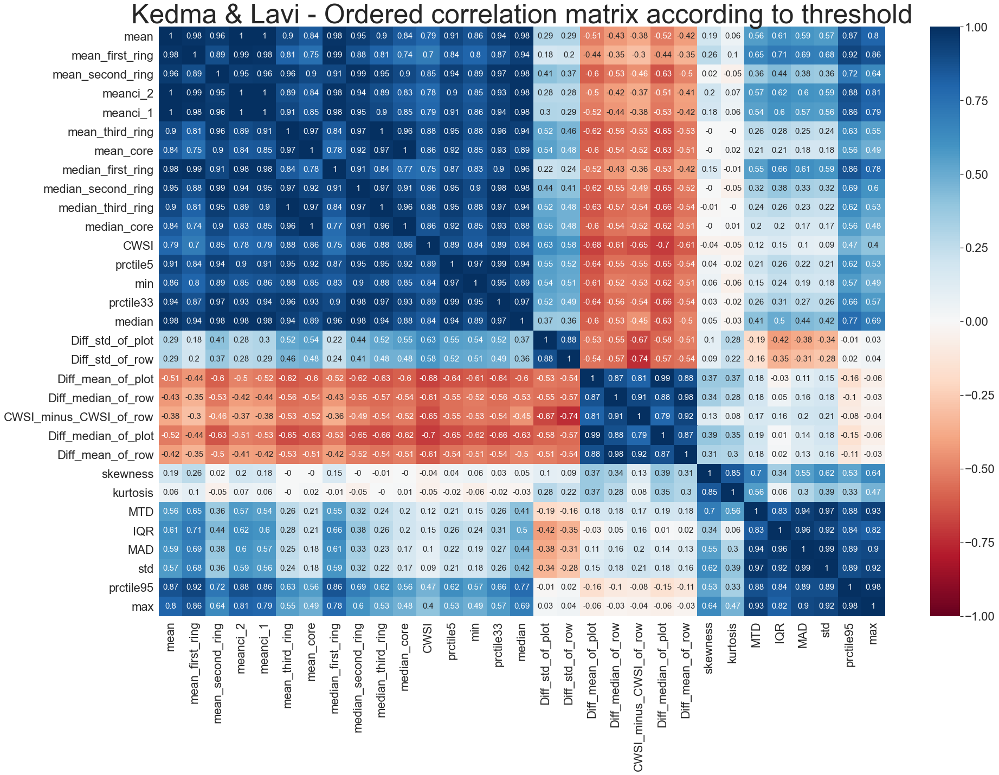

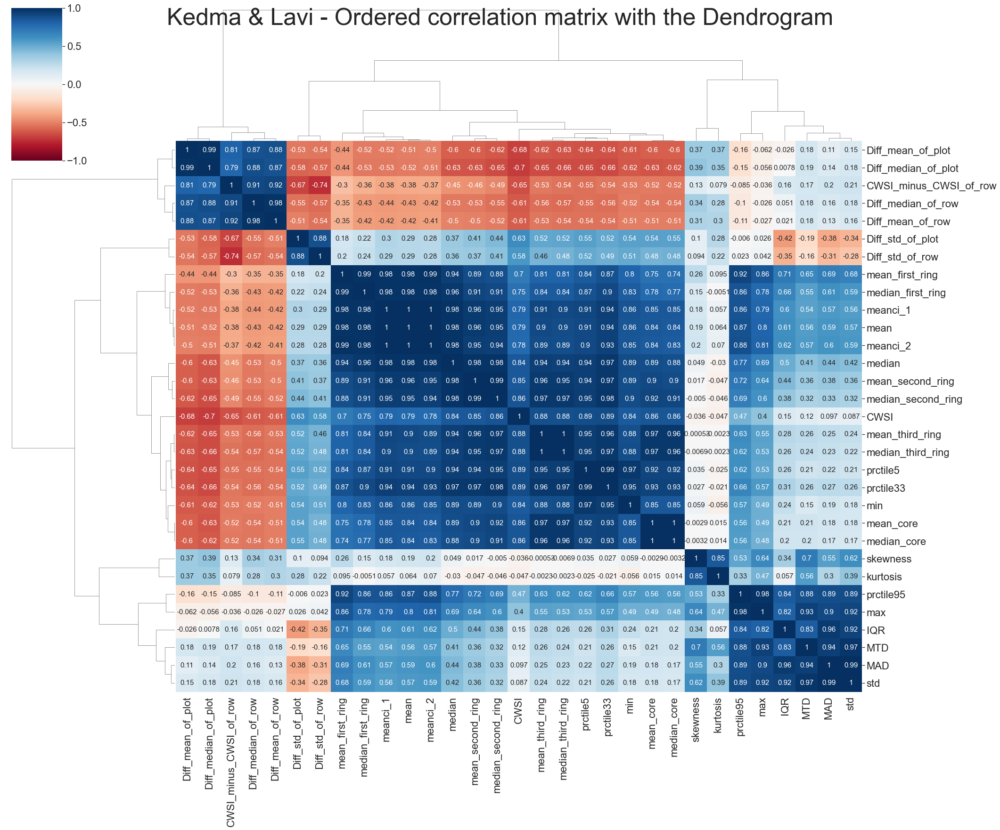

In [10]:
correlations(df_out[predictors],0.4,'Kedma & Lavi')

###  Kedma

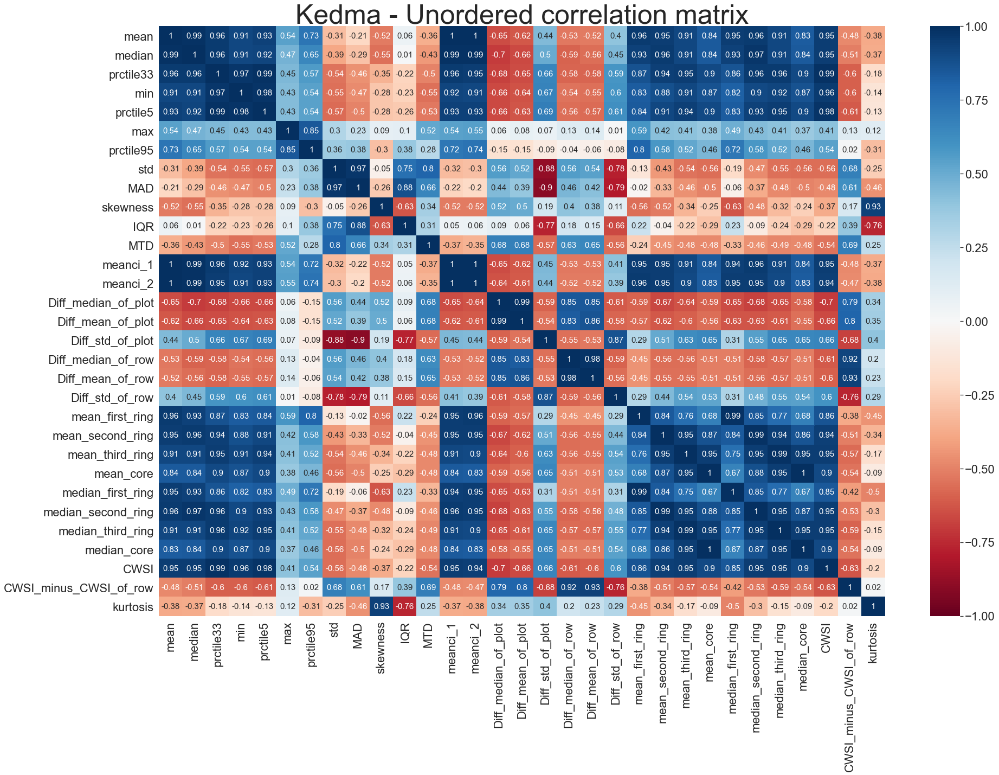

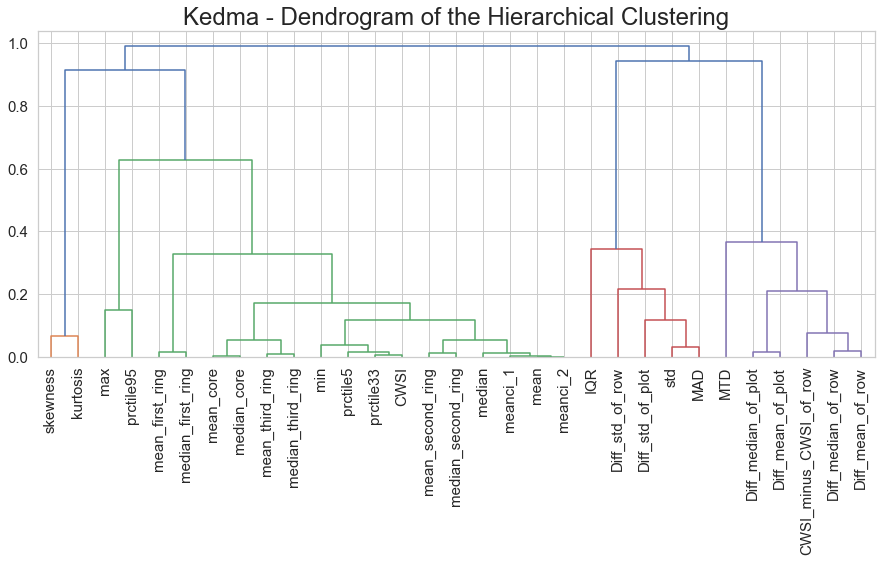

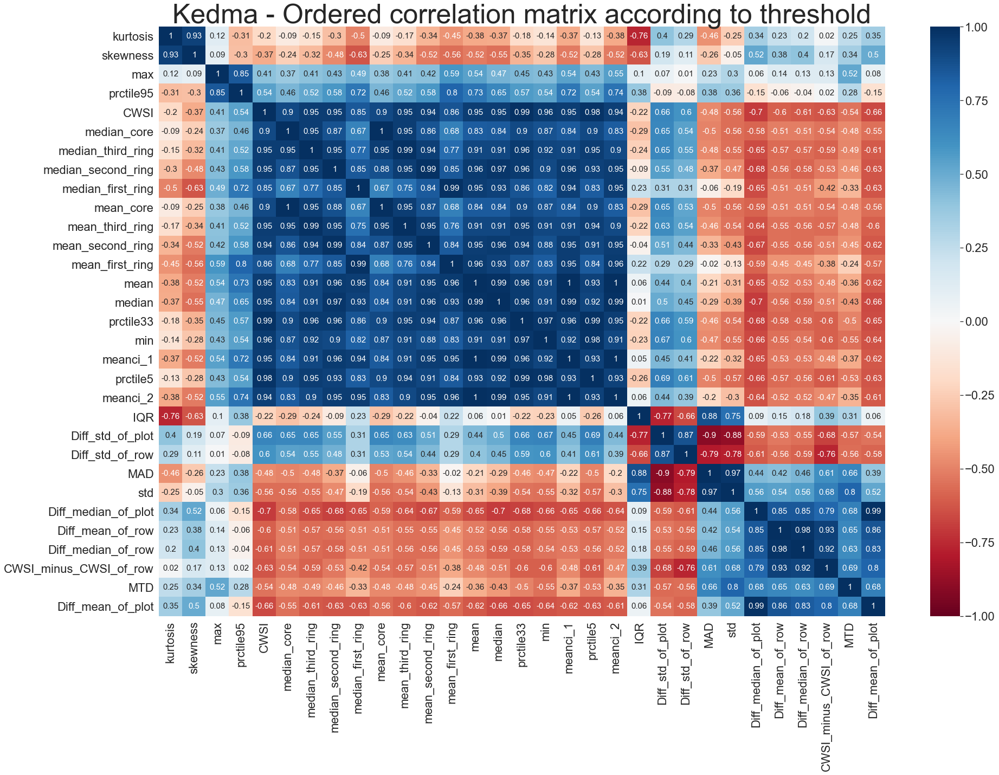

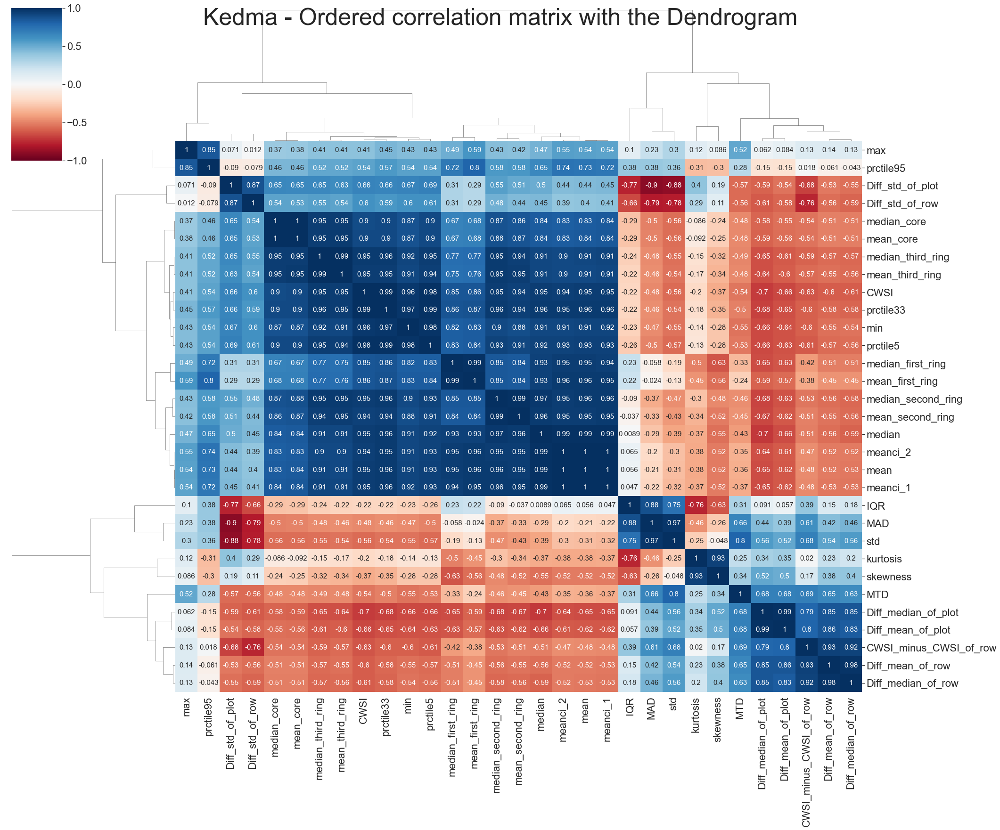

In [13]:
df_out_Kedma = df_out[df_out.Site_Name == 'Kedma'].copy(True) 
correlations(df_out_Kedma[predictors],0.4,'Kedma')

###  Lavi

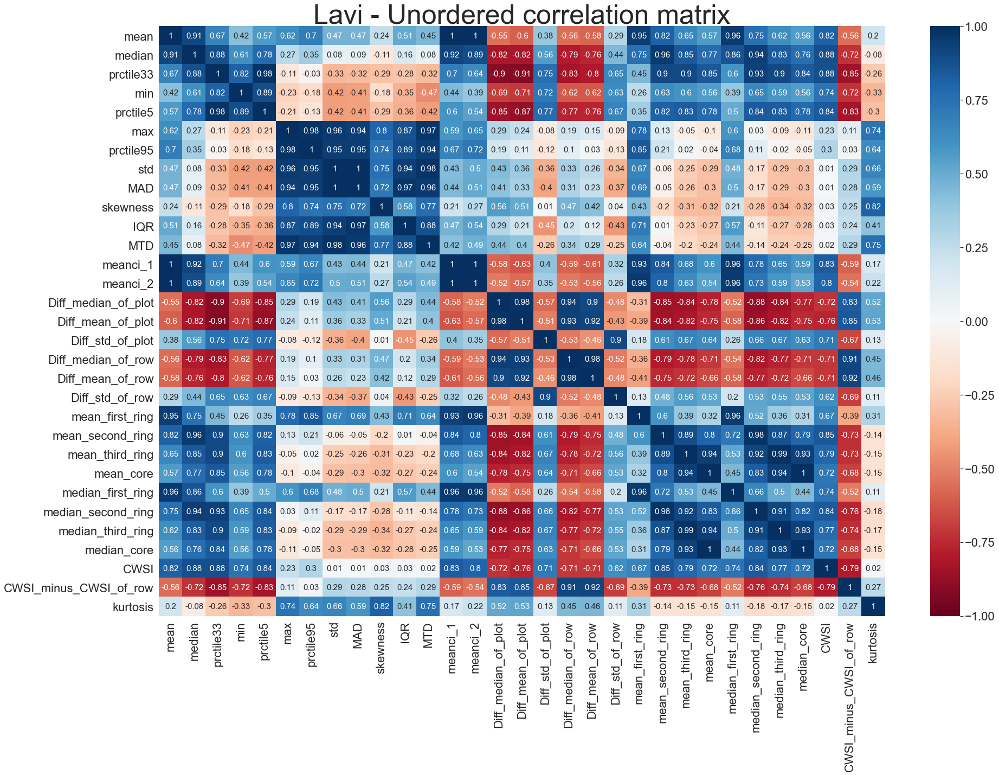

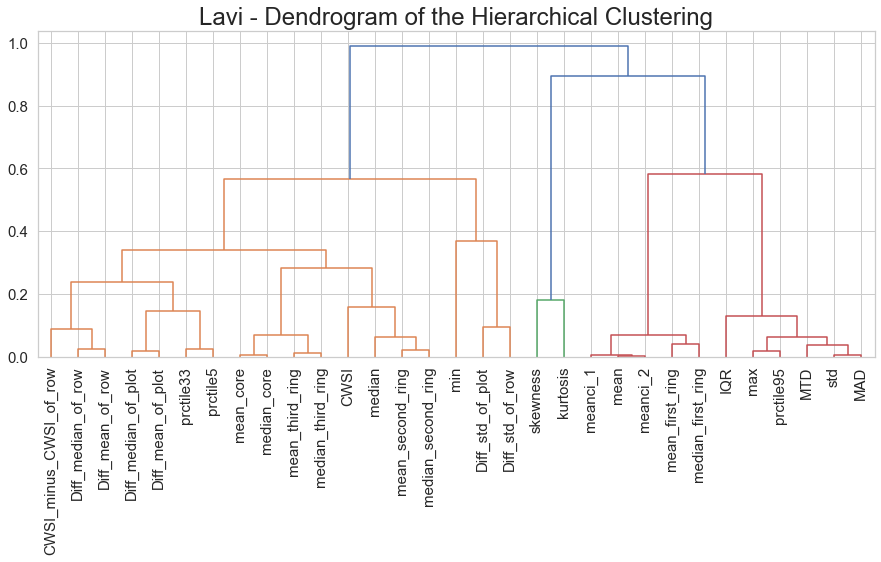

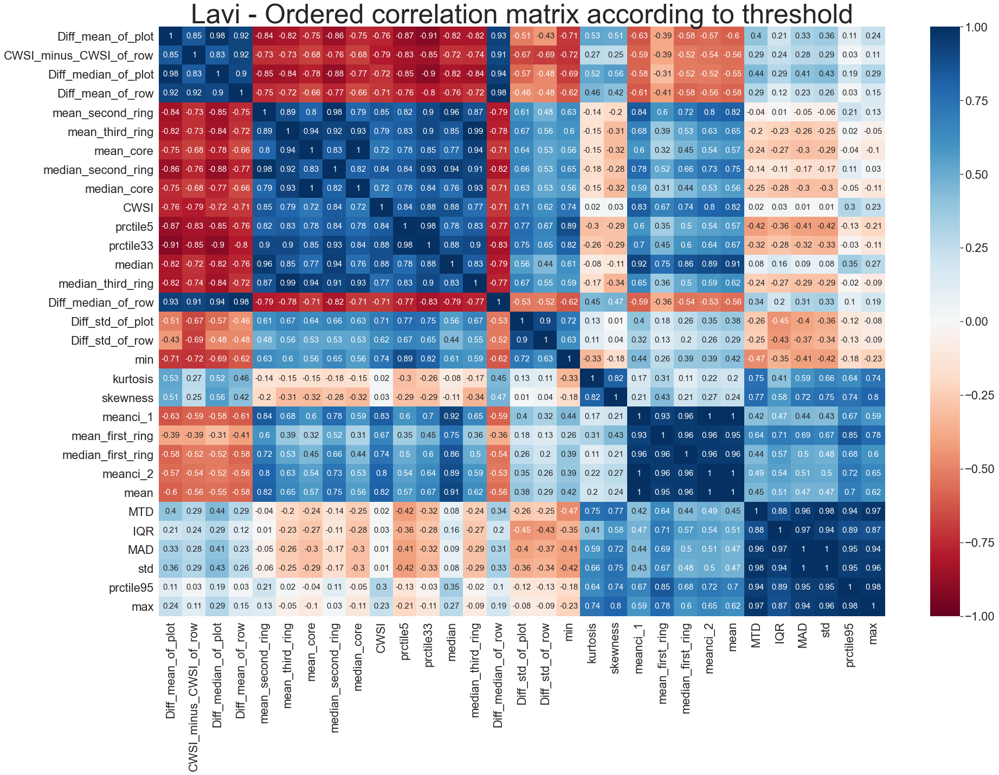

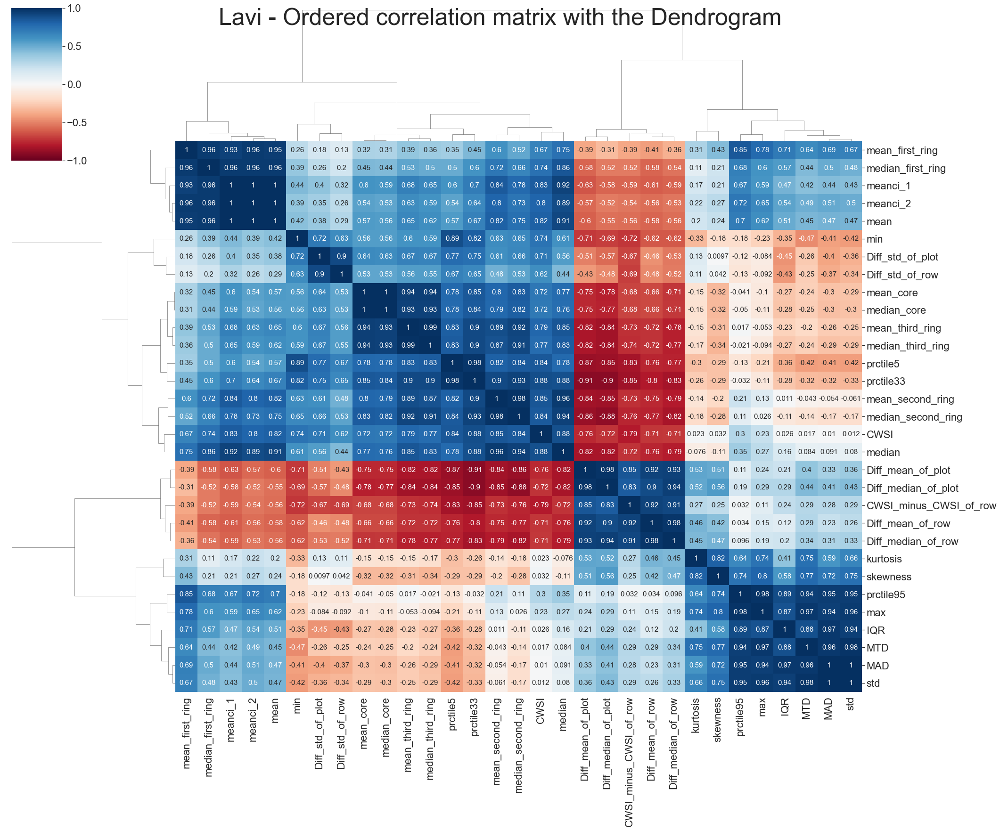

In [14]:
df_out_Lavi = df_out[df_out.Site_Name == 'Lavi'].copy(True) 
correlations(df_out_Lavi[predictors],0.4,'Lavi')

# Pearson Partial correlation

In [15]:
def partial_correlations(data,threshold,dataset_name):
    import pingouin as pg

    sns.set(font_scale=2)
    plt.figure(figsize=(30,20))
    correlations = data.pcorr()
    sns.heatmap(round(correlations,2), cmap='RdBu', annot=True, 
                annot_kws={"size": 15}, vmin=-1, vmax=1).set_title(dataset_name+' - Unordered partial correlation matrix',fontsize=50)

    from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
    from scipy.spatial.distance import squareform
    sns.set_style("whitegrid")

    # plt.figure(figsize=(12,5))
    dissimilarity = 1 - abs(correlations)
    Z = linkage(squareform(dissimilarity,checks=False), 'complete')
    f, ax =plt.subplots(1, 1,figsize=(15,6))
    ax.title.set_text(dataset_name+' - Dendrogram of the Hierarchical Clustering')
    dendrogram(Z, labels=data.columns,ax=ax, orientation='top',
               leaf_rotation=90)
    ax.tick_params(axis='x', which='major', labelsize=15)
    ax.tick_params(axis='y', which='major', labelsize=15)
    # Clusterize the data
    labels = fcluster(Z, threshold, criterion='distance')

    # Show the cluster
    import numpy as np

    # Keep the indices to sort labels
    labels_order = np.argsort(labels)

    # Build a new dataframe with the sorted columns
    for idx, i in enumerate(data.columns[labels_order]):
        if idx == 0:
            clustered = pd.DataFrame(data[i])
        else:
            df_to_append = pd.DataFrame(data[i])
            clustered = pd.concat([clustered, df_to_append], axis=1)
    plt.figure(figsize=(30,20))
    correlations = clustered.pcorr()
    sns.heatmap(round(correlations,2), cmap='RdBu', annot=True, 
                annot_kws={"size": 15}, vmin=-1, vmax=1).set_title(dataset_name+' - Ordered partial correlation matrix according to threshold',fontsize=50)
    sns.set(font_scale=2)
    g = sns.clustermap(correlations, method="complete", cmap='RdBu', annot=True, 
                   annot_kws={"size": 15}, vmin=-1, vmax=1, figsize=(30,25)).fig.suptitle(dataset_name+' - Ordered partial correlation matrix with the Dendrogram',fontsize=50)
    return correlations


### Keamd & Lavi

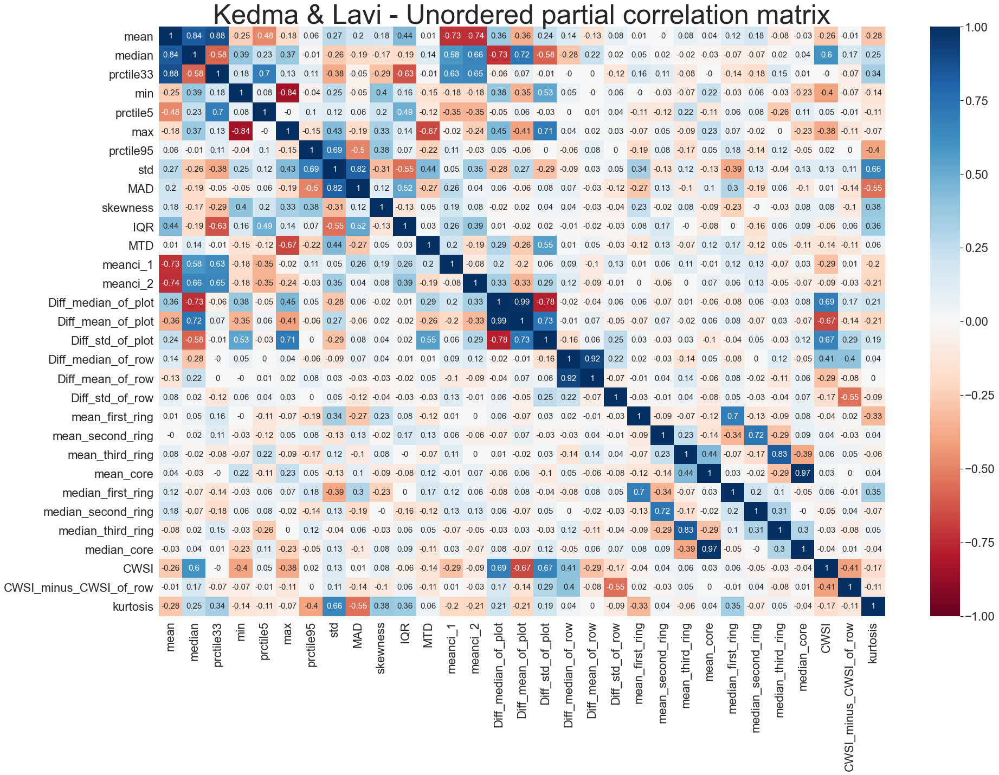

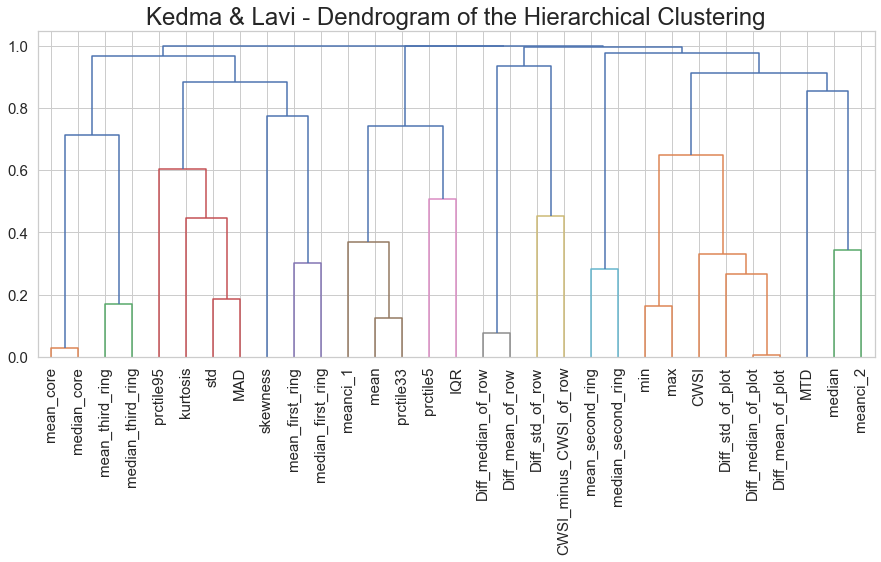

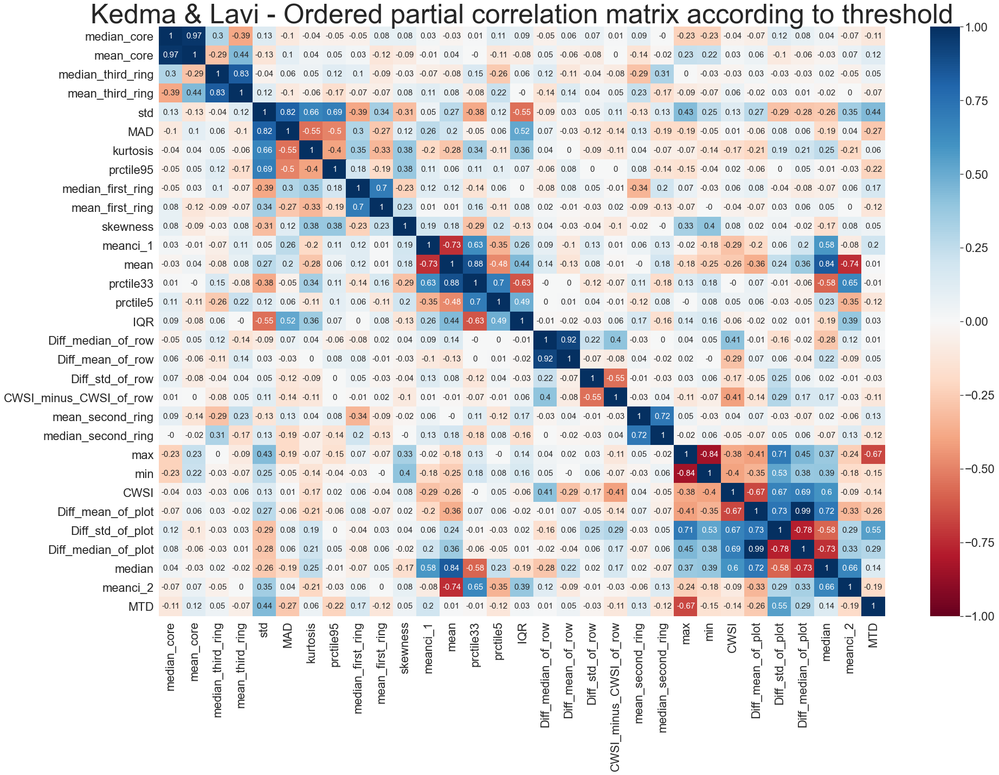

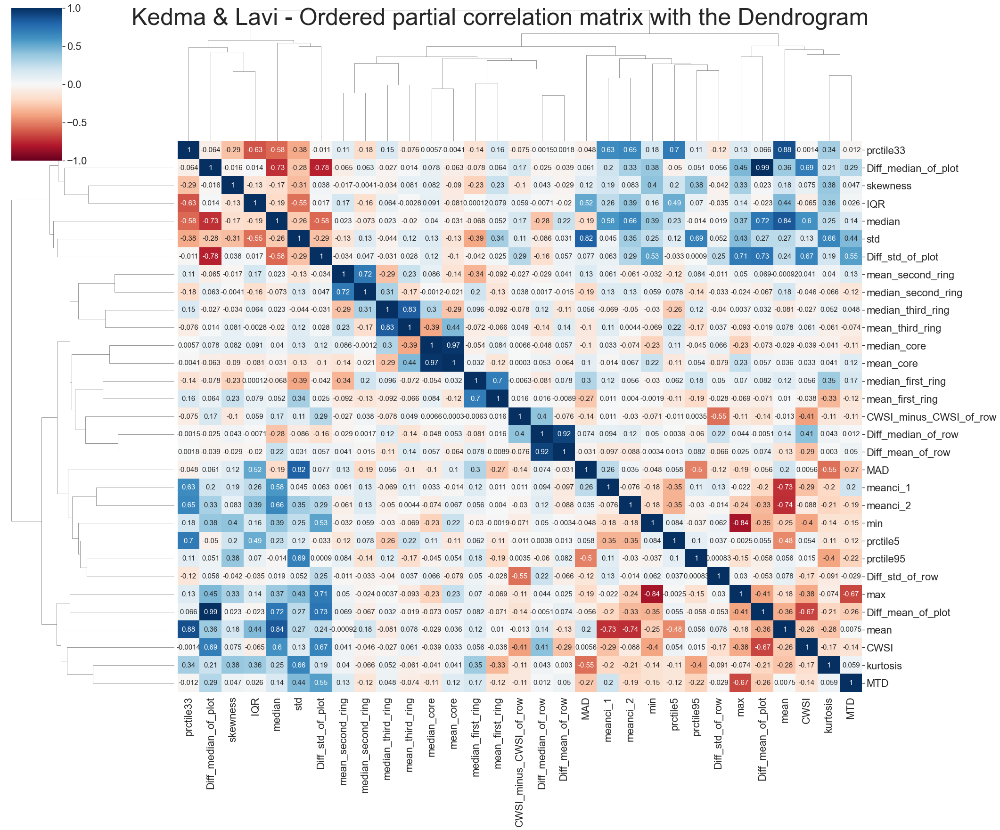

In [65]:
pcor_K_L = partial_correlations(df_out[predictors],0.4,'Kedma & Lavi')

In [66]:
pcorr = pcor_K_L[predictors]
pcorr_triu = pcorr.stack()
filterd = pcorr_triu[0.7<pcorr_triu]
# print(len(filterd[filterd<1])/2)
pd.DataFrame(filterd[filterd<1])

0
median_core         mean_core            0.970593
mean_core           median_core          0.970593
median_third_ring   mean_third_ring      0.830413
mean_third_ring     median_third_ring    0.830413
std                 MAD                  0.815726
MAD                 std                  0.815726
mean                median               0.843906
                    prctile33            0.876157
prctile33           mean                 0.876157
                    prctile5             0.703456
prctile5            prctile33            0.703456
Diff_median_of_row  Diff_mean_of_row     0.924962
Diff_mean_of_row    Diff_median_of_row   0.924962
mean_second_ring    median_second_ring   0.717733
median_second_ring  mean_second_ring     0.717733
max                 Diff_std_of_plot     0.708973
Diff_mean_of_plot   median               0.719195
                    Diff_median_of_plot  0.993619
                    Diff_std_of_plot     0.732858
Diff_std_of_plot    max                  0.708973
                    Diff_mean_of_plot    0.732858
Diff_median_of_plot Diff_mean_of_plot    0.993619
median              mean                 0.843906
                    Diff_mean_of_plot    0.719195

### Kedma

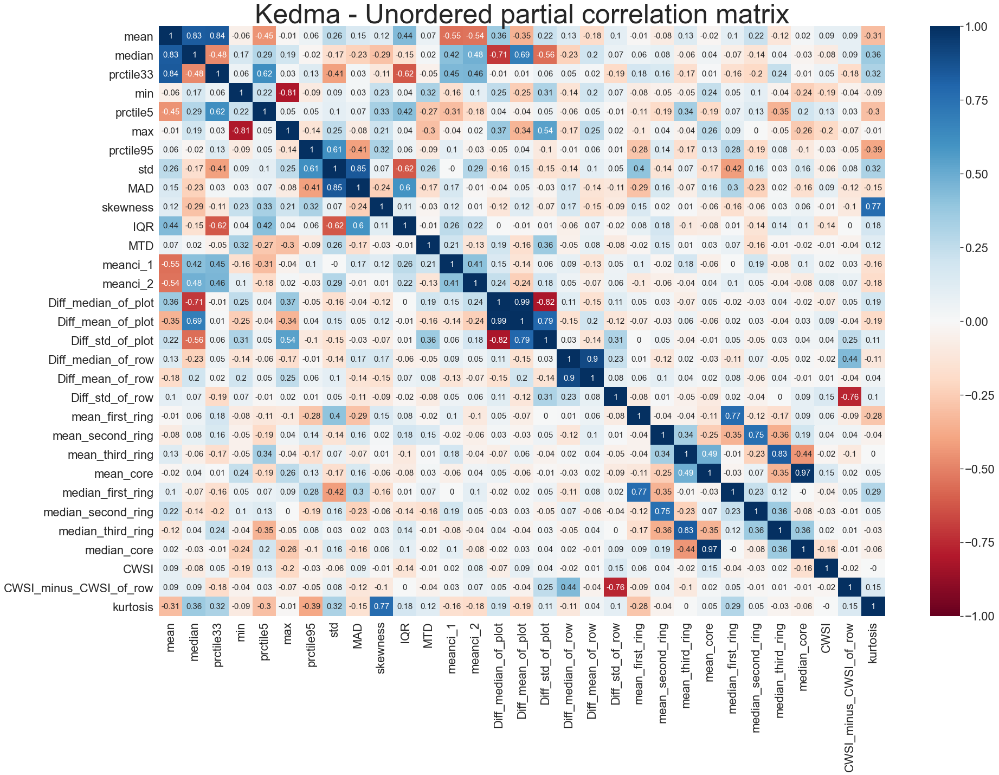

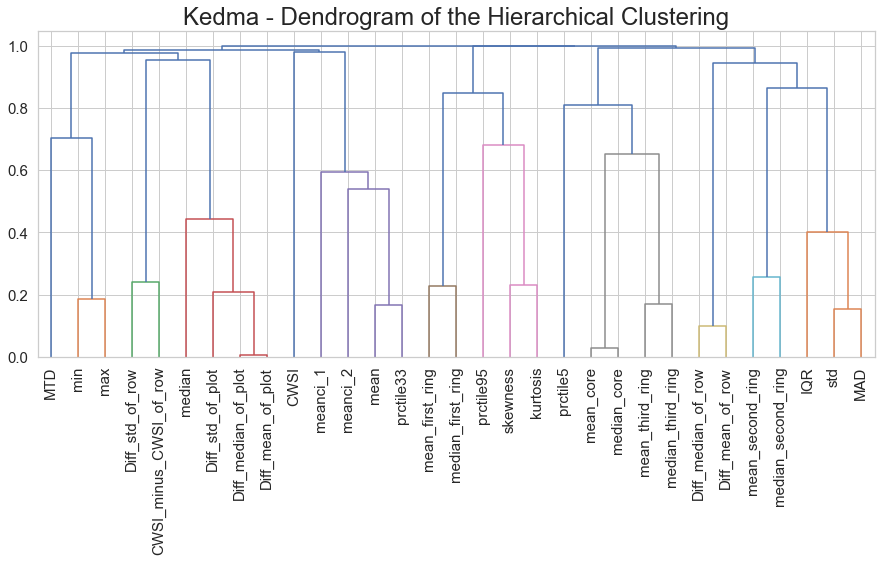

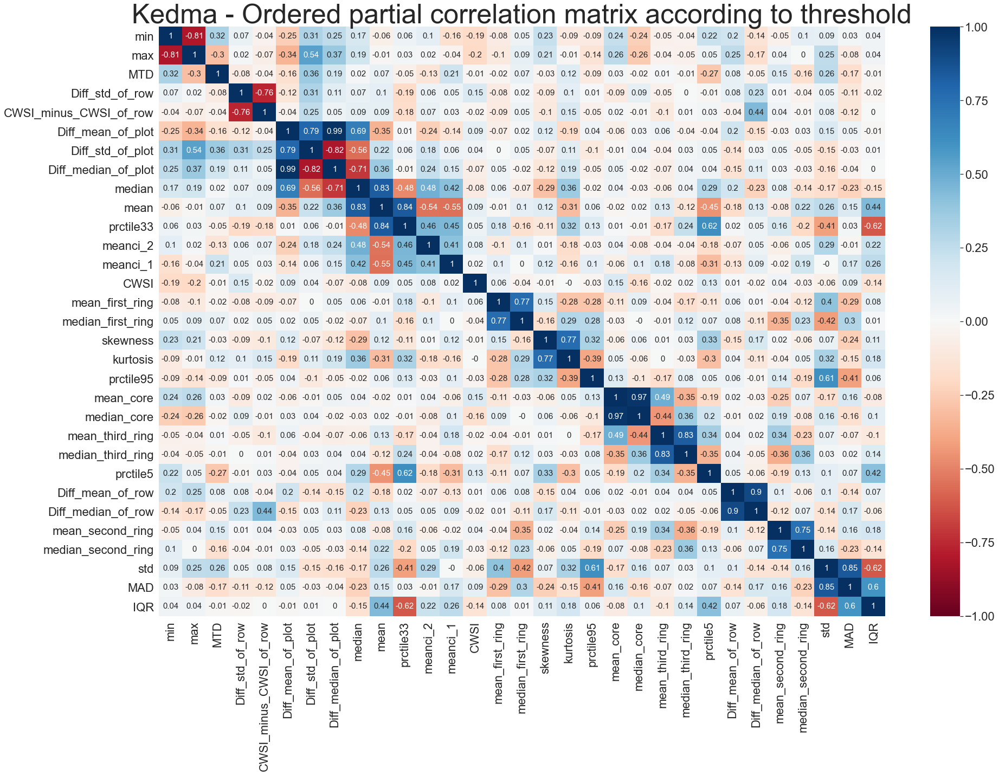

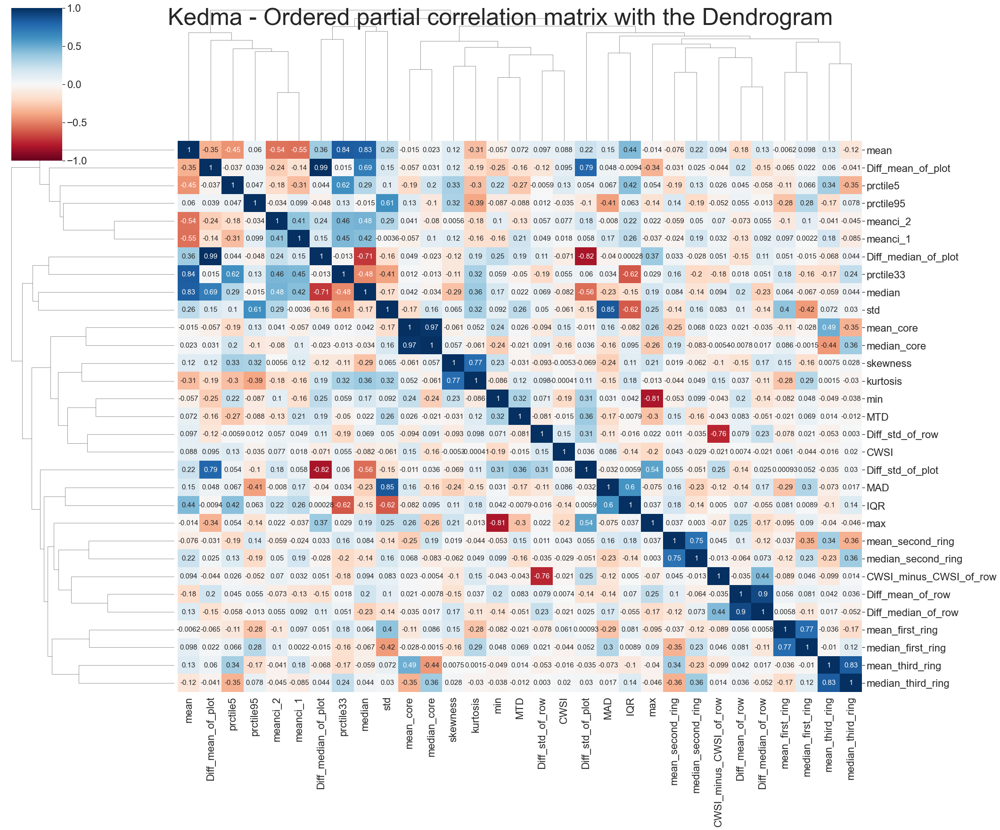

In [67]:
pcor_K = partial_correlations(df_out_Kedma[predictors],0.4,'Kedma')

In [109]:
pcorr = pcor_K[predictors]
pcorr_triu = pcorr.stack()
filterd = pcorr_triu[0.7<pcorr_triu]
print(len(filterd[filterd<1])/2)
Correlated_Kedma = pd.DataFrame(filterd[filterd<1],columns = ['Kedma']).reset_index()
Correlated_Kedma_new = Correlated_Kedma[~Correlated_Kedma[['level_0', 'level_1']].apply(frozenset, axis=1).duplicated()].set_index(['level_0', 'level_1'])
Correlated_Kedma_new

11.0


Kedma
level_0           level_1                      
Diff_mean_of_plot Diff_median_of_plot  0.994762
                  Diff_std_of_plot     0.793389
median            mean                 0.825773
mean              prctile33            0.835089
mean_first_ring   median_first_ring    0.772008
skewness          kurtosis             0.769754
mean_core         median_core          0.971598
mean_third_ring   median_third_ring    0.830869
Diff_mean_of_row  Diff_median_of_row   0.902751
mean_second_ring  median_second_ring   0.745006
std               MAD                  0.845180

### Lavi

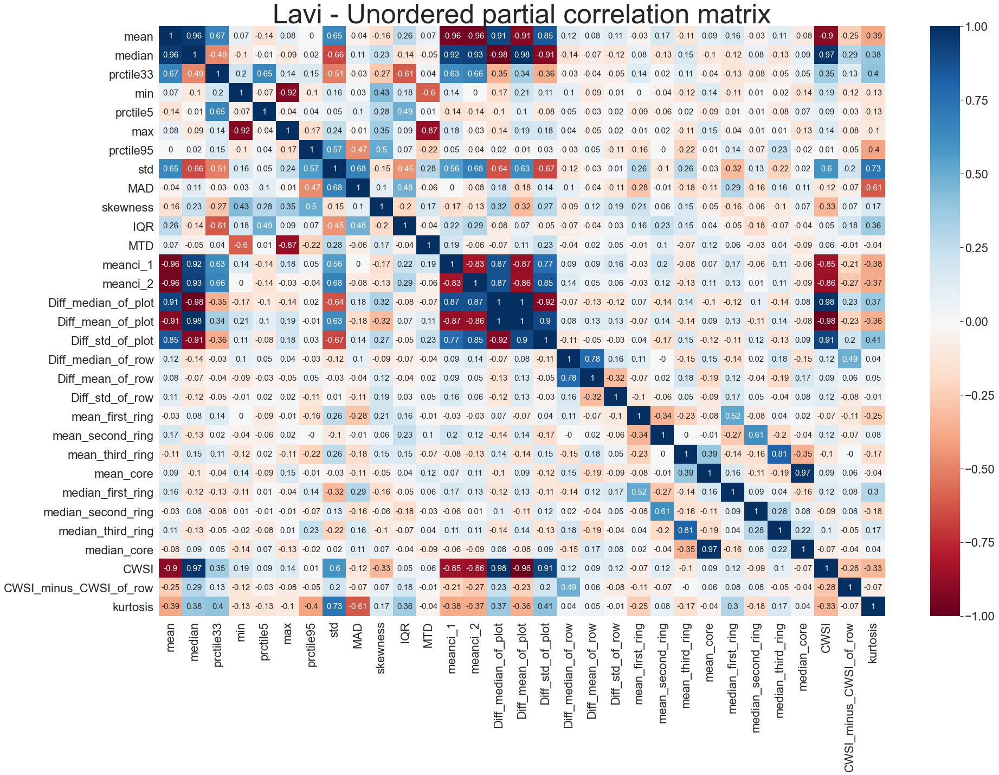

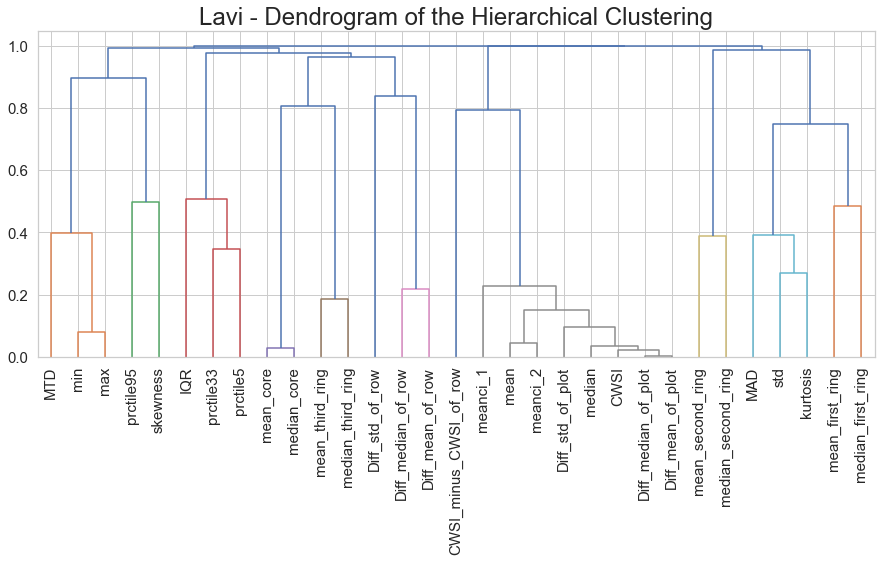

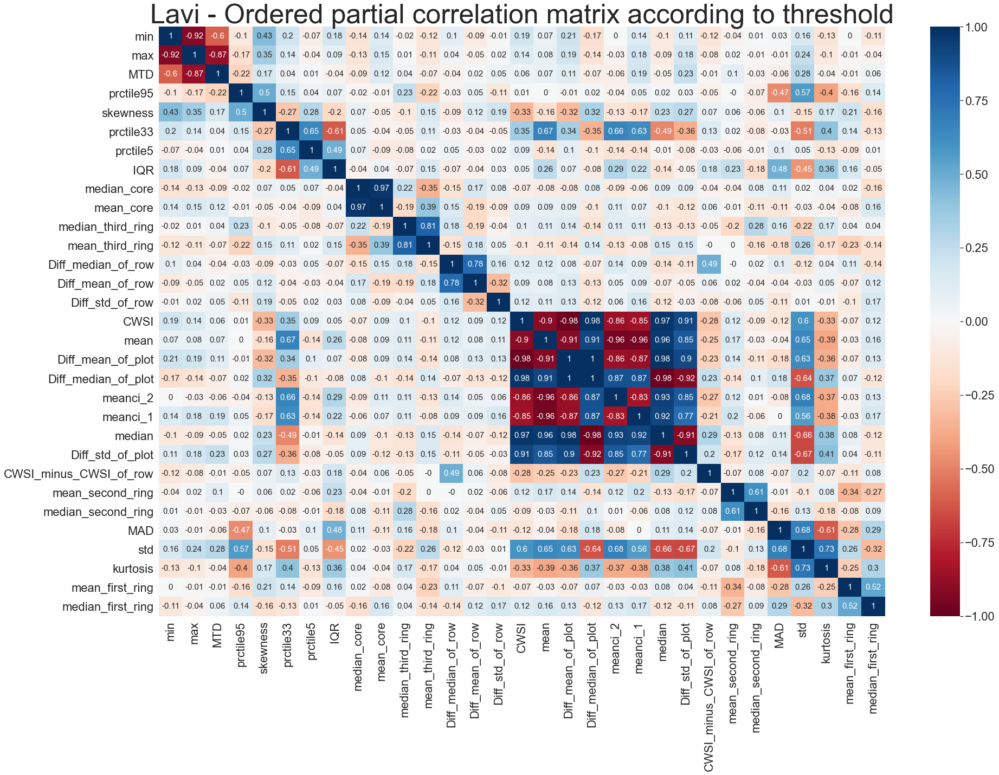

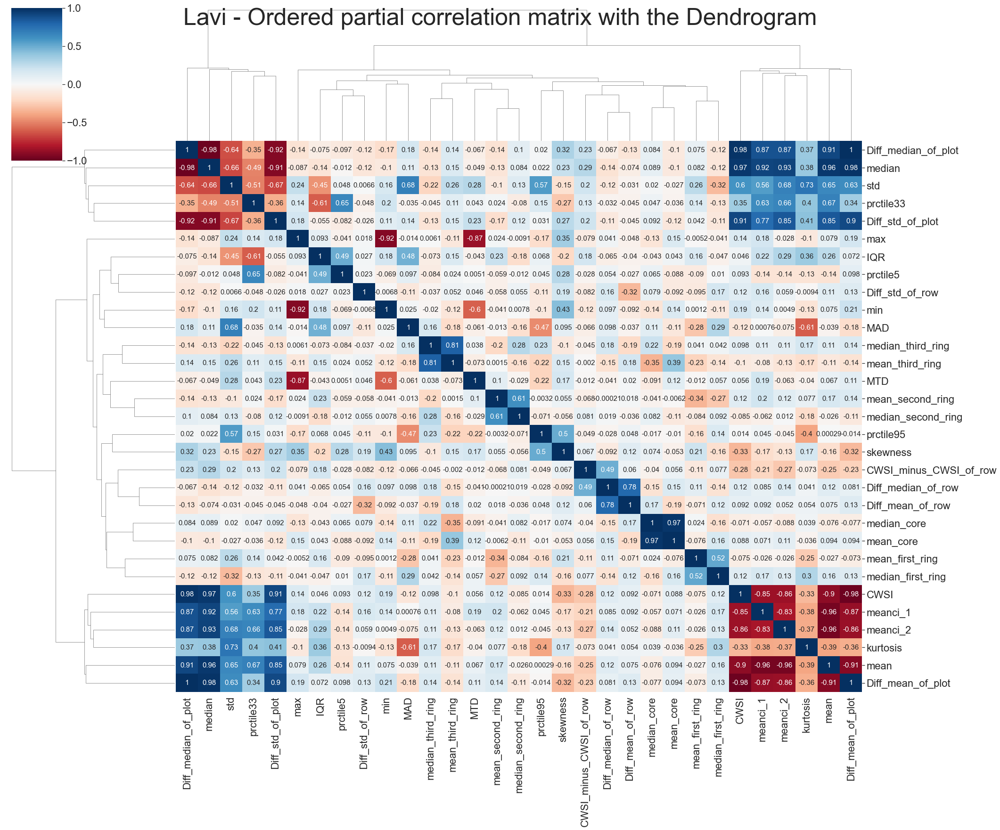

In [69]:
pcor_L = partial_correlations(df_out_Lavi[predictors],0.4,'Lavi')

In [108]:
pcorr = pcor_L[predictors]
pcorr_triu = pcorr.stack()
filterd = pcorr_triu[0.7<pcorr_triu]
print(len(filterd[filterd<1])/2)
Correlated_Lavi = pd.DataFrame(filterd[filterd<1],columns = ['Lavi']).reset_index()
Correlated_Lavi_new = Correlated_Lavi[~Correlated_Lavi[['level_0', 'level_1']].apply(frozenset, axis=1).duplicated()].set_index(['level_0', 'level_1'])
Correlated_Lavi_new

19.0


Lavi
level_0             level_1                      
median_core         mean_core            0.971132
median_third_ring   mean_third_ring      0.813214
Diff_median_of_row  Diff_mean_of_row     0.781697
CWSI                median               0.965436
                    Diff_median_of_plot  0.977710
                    Diff_std_of_plot     0.911027
mean                median               0.964013
                    Diff_median_of_plot  0.908244
                    Diff_std_of_plot     0.848439
Diff_mean_of_plot   median               0.976883
                    Diff_median_of_plot  0.997955
                    Diff_std_of_plot     0.904846
Diff_median_of_plot meanci_1             0.867596
                    meanci_2             0.868551
meanci_2            median               0.925202
                    Diff_std_of_plot     0.849596
meanci_1            median               0.917546
                    Diff_std_of_plot     0.772199
std                 kurtosis             0.730585

# Correlated features

In [110]:
pcorr = df_out[predictors].pcorr()
pcorr_triu = pcorr.stack()
filterd = pcorr_triu[0.69<pcorr_triu]
# print(len(filterd[filterd<1])/2)
Correlated_combined = pd.DataFrame(filterd[filterd<1],columns = ['Kedma&Lavi']).reset_index()
Correlated_combined_new = Correlated_combined[~Correlated_combined[['level_0', 'level_1']].apply(frozenset, axis=1).duplicated()].set_index(['level_0', 'level_1'])
Correlated_combined_new

Kedma&Lavi
level_0             level_1                       
mean                median                0.843906
                    prctile33             0.876157
median              Diff_mean_of_plot     0.719195
prctile33           prctile5              0.703456
max                 Diff_std_of_plot      0.708973
std                 MAD                   0.815726
Diff_median_of_plot Diff_mean_of_plot     0.993619
                    CWSI                  0.694985
Diff_mean_of_plot   Diff_std_of_plot      0.732858
Diff_median_of_row  Diff_mean_of_row      0.924962
mean_first_ring     median_first_ring     0.697121
mean_second_ring    median_second_ring    0.717733
mean_third_ring     median_third_ring     0.830413
mean_core           median_core           0.970593

In [113]:
all_Correlated = pd.concat([Correlated_combined_new,Correlated_Kedma_new,Correlated_Lavi_new],axis=1)
all_Correlated

Kedma&Lavi     Kedma      Lavi
level_0             level_1                                            
CWSI                Diff_median_of_plot         NaN       NaN  0.977710
                    Diff_std_of_plot            NaN       NaN  0.911027
                    median                      NaN       NaN  0.965436
Diff_mean_of_plot   Diff_median_of_plot         NaN  0.994762  0.997955
                    Diff_std_of_plot       0.732858  0.793389  0.904846
                    median                      NaN       NaN  0.976883
Diff_mean_of_row    Diff_median_of_row          NaN  0.902751       NaN
Diff_median_of_plot CWSI                   0.694985       NaN       NaN
                    Diff_mean_of_plot      0.993619       NaN       NaN
                    meanci_1                    NaN       NaN  0.867596
                    meanci_2                    NaN       NaN  0.868551
Diff_median_of_row  Diff_mean_of_row       0.924962       NaN  0.781697
max                 Diff_std_of_plot       0.708973       NaN       NaN
mean                Diff_median_of_plot         NaN       NaN  0.908244
                    Diff_std_of_plot            NaN       NaN  0.848439
                    median                 0.843906       NaN  0.964013
                    prctile33              0.876157  0.835089       NaN
mean_core           median_core            0.970593  0.971598       NaN
mean_first_ring     median_first_ring      0.697121  0.772008       NaN
mean_second_ring    median_second_ring     0.717733  0.745006       NaN
mean_third_ring     median_third_ring      0.830413  0.830869       NaN
meanci_1            Diff_std_of_plot            NaN       NaN  0.772199
                    median                      NaN       NaN  0.917546
meanci_2            Diff_std_of_plot            NaN       NaN  0.849596
                    median                      NaN       NaN  0.925202
median              Diff_mean_of_plot      0.719195       NaN       NaN
                    mean                        NaN  0.825773       NaN
median_core         mean_core                   NaN       NaN  0.971132
median_third_ring   mean_third_ring             NaN       NaN  0.813214
prctile33           prctile5               0.703456       NaN       NaN
skewness            kurtosis                    NaN  0.769754       NaN
std                 MAD                    0.815726  0.845180       NaN
                    kurtosis                    NaN       NaN  0.730585

# Spearman Correlation

In [114]:
df_out.loc[df_out.Type == 'Clog', 'Y'] = 0
df_out.loc[df_out.Type == 'Control', 'Y'] = 1
df_out.loc[df_out.Type == 'Leak', 'Y'] = 2

In [115]:
df_out_Kedma = df_out[df_out.Site_Name == 'Kedma'].copy(True)
df_out_Lavi = df_out[df_out.Site_Name == 'Lavi'].copy(True)

In [116]:
predictors_y = predictors.copy()
predictors_y.append('Y')

In [117]:
from scipy import stats
data = df_out[predictors_y]
cor, pvalue = stats.spearmanr(df_out[predictors],df_out['Y'])
spearmanr = pd.DataFrame(cor)[[31]].drop(31).rename(columns={31: "r"}).sort_values(by=['r'],ascending=False)
spearmanr['var']=predictors
spearmanr = spearmanr.set_index('var')

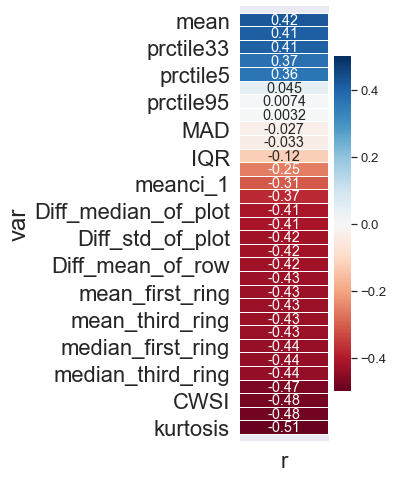

In [118]:
fix,ax = plt.subplots(figsize=(2,8))
sns.set(font_scale=1.2)
sns.heatmap(spearmanr,vmax=0.5,vmin=-0.5,linewidths=0.005,annot=True,linecolor="white", cmap='RdBu')
bottom,top=ax.get_ylim()
ax.set_ylim(bottom+0.5,top-0.5)
plt.show()


## partial Spearman Correlation

In [119]:
def partial_spearman(data,predictors):
    import pingouin as pg

    All_spearman_pcorr = pd.DataFrame()
    for i in data[predictors].columns:
        covar_pre = predictors.copy()
        spearman_pcorr = pg.partial_corr(data = data,x=i,y= 'Y', method = 'spearman',covar=covar_pre.remove(i))
        spearman_pcorr['X'] = i
        All_spearman_pcorr = All_spearman_pcorr.append(spearman_pcorr)
    All_spearman_pcorr = All_spearman_pcorr.reset_index().drop(['index'], axis=1)
    All_spearman_pcorr['r_abs']=All_spearman_pcorr.r.abs()
    All_spearman_pcorr['p-val']<=0.05 #just IQR is not stat sig
    All_spearman_pcorr = All_spearman_pcorr.sort_values(by=['r_abs'])
    partial_spearman= All_spearman_pcorr[['X','r','r_abs']].copy(True)
    partial_spearman = partial_spearman.sort_values(by=['r'],ascending=False).set_index('X').rename(columns={"r": "r partial"})
    return partial_spearman

In [120]:
partial_spearman_Kedma_Lavi = partial_spearman(df_out,predictors)[['r_abs']].rename(columns={"r_abs": "|r| Lavi&Kedma"})
partial_spearman_Kedma = partial_spearman(df_out_Kedma,predictors)[['r_abs']].rename(columns={"r_abs": "|r| Kedma"})
partial_spearman_Lavi = partial_spearman(df_out_Lavi,predictors)[['r_abs']].rename(columns={"r_abs": "|r| Lavi"})
r_abs_all_datasets = pd.concat([partial_spearman_Kedma_Lavi,partial_spearman_Kedma,partial_spearman_Lavi],axis=1).sort_values(by=['|r| Kedma'],ascending=False)

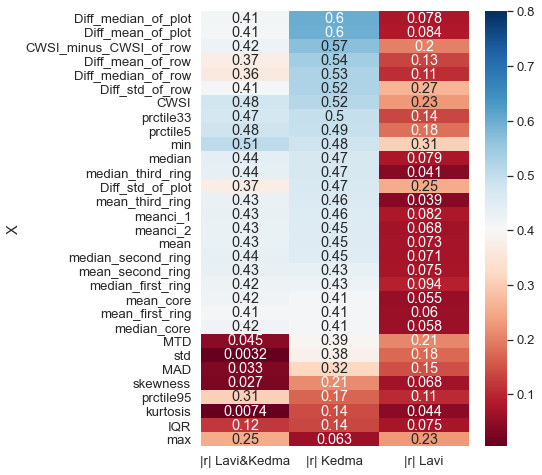

In [121]:
fix,ax = plt.subplots(figsize=(6,8))
sns.set(font_scale=1.2)
sns.heatmap(r_abs_all_datasets,vmax=0.8,vmin=0.005,linewidths=0,annot=True,linecolor="white",cmap='RdBu')
bottom,top=ax.get_ylim()
plt.show()

In [122]:
All_spearman = partial_spearman(df_out,predictors).rename(columns={"r_abs": "|r| partial","r": "r partial"})
All_spearman = pd.concat([All_spearman,spearmanr],axis=1)
All_spearman['|r|']=All_spearman['r'].abs()


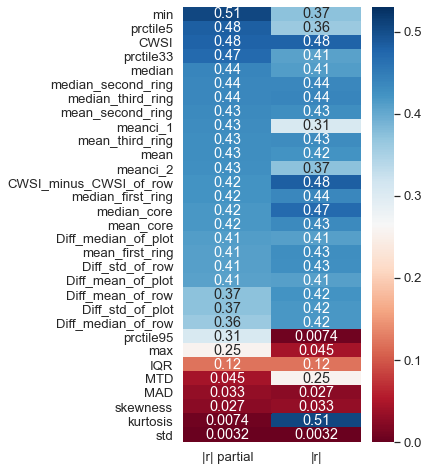

In [123]:
fix,ax = plt.subplots(figsize=(4,8))
sns.set(font_scale=1.2)
All_spearman =All_spearman.sort_values(by=['|r| partial'],ascending=False)
sns.heatmap(All_spearman[['|r| partial','|r|']],vmax=0.53,vmin=0,
            linewidths=0,annot=True,
            linecolor="white", cmap='RdBu')
bottom,top=ax.get_ylim()
# ax.set_ylim(bottom+0.5,top-0.5)
plt.show()

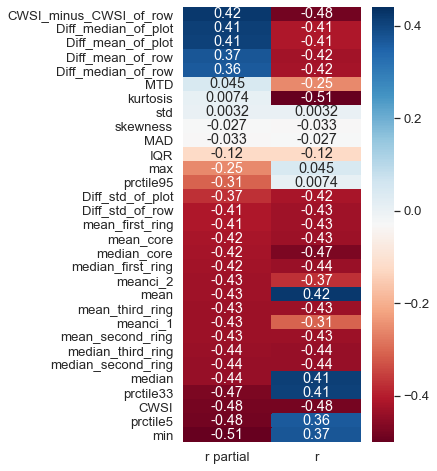

In [124]:
fix,ax = plt.subplots(figsize=(4,8))
sns.set(font_scale=1.2)
All_spearman =All_spearman.sort_values(by=['r partial'],ascending=False)
sns.heatmap(All_spearman[['r partial','r']],vmax=0.44,vmin=-0.5,
            linewidths=0,annot=True,
            linecolor="white", cmap='RdBu')
bottom,top=ax.get_ylim()
# ax.set_ylim(bottom+0.5,top-0.5)
plt.show()

### Elimination of highly correlated features that were less correlat with Y

In [125]:
describe= df_out[['min','max','mean',
       'median','MTD','std','IQR',
       'MAD','prctile5','prctile95',
       'prctile33','meanci_1','meanci_2',
      'skewness','kurtosis',
       'Diff_median_of_plot','Diff_mean_of_plot',
      'Diff_std_of_plot',
       'Diff_median_of_row','Diff_mean_of_row',
      'Diff_std_of_row','CWSI','CWSI_minus_CWSI_of_row',
       'mean_first_ring','median_first_ring',
       'mean_second_ring','median_second_ring',
      'mean_third_ring','median_third_ring',
      'mean_core','median_core']].describe(include='all').T

describe['range']=describe['min'].map('{:,.2f}'.format).astype(str)+','+describe['max'].map('{:,.2f}'.format).astype(str)


In [126]:
eliminated_pred = ['mean','max','MAD',
                     'kurtosis','Diff_mean_of_plot',
                     'Diff_median_of_row','mean_first_ring',
                     'mean_second_ring','mean_third_ring','mean_core']

DataNew = df_out.drop(eliminated_pred, axis=1).copy(True)

predictors = ['mean','median','prctile33','min','prctile5','max','prctile95', 'std', 'MAD',
'skewness','IQR','MTD','meanci_1','meanci_2','Diff_median_of_plot','Diff_mean_of_plot','Diff_std_of_plot', 
'Diff_median_of_row','Diff_mean_of_row','Diff_std_of_row', 'mean_first_ring', 'mean_second_ring',
'mean_third_ring','mean_core', 'median_first_ring','median_second_ring', 'median_third_ring',
'median_core', 'CWSI', 'CWSI_minus_CWSI_of_row','kurtosis']
predictors_new = [ele for ele in predictors if ele not in eliminated_pred]


### Exmine VIF after feature elimination

In [127]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()
X = DataNew[predictors_new]
vif_data["feature"] = X.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]
  
print(vif_data)

                   feature           VIF
0                   median   7351.540209
1                prctile33  19827.648210
2                      min     35.608637
3                 prctile5    621.038933
4                prctile95   6654.429541
5                      std  15115.878070
6                 skewness     66.514160
7                      IQR   1622.997100
8                      MTD   1047.985863
9                 meanci_1  33216.123202
10                meanci_2  44340.895960
11     Diff_median_of_plot     10.107016
12        Diff_std_of_plot     21.043433
13        Diff_mean_of_row     18.151891
14         Diff_std_of_row      7.853755
15       median_first_ring    513.478363
16      median_second_ring    267.285192
17       median_third_ring    141.587396
18             median_core     41.747654
19                    CWSI     16.340007
20  CWSI_minus_CWSI_of_row     21.123445


In [128]:
DataNew.to_excel("data_Kedma&Lavi_afer_DataPreparation.xlsx") 